Observations and notes from meeting on wed 5 aug:

The **inside percentages graph is broken**.  It looks like the data checks out (adds up to 1 with outside class interactions), but the graph (green) doesn't look right

Before noon, there are a lot of interactions, and nearly all of them are in the same class.  
Later, the number of total interactions decreases, but a higher percentage of them are in different classes.
At around 3 pm, there's a dip in the number of total interactions, which is most visible on Friday.  
Also, for nearly every day, the percentage of outside class interactions takes a dip.

In [2]:
import csv
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import time
import datetime

#%matplotlib notebook

In [3]:
inside_class_interactions = {} #key is timestamp, value is occurances when students are in the same class
outside_class_interactions = {} #key is timestamp, value is occurances when students are in different class
total_class_interactions = {} #key is timestamp, value is occurances
with open("data/original/High-School_data_2013.csv", 'r') as infile:
    reader = csv.reader(infile, delimiter=" ")
    for t, id1, id2, cls1, cls2 in reader:
        ts = datetime.datetime.fromtimestamp(time.mktime(time.gmtime(int(t) + 3600))) #.strftime("%A, %B %d, %Y %H:%M:%S") #time.strftime("%a %H:%M:%S", time.gmtime(int(t) + 3600))
        #datetime datetime objects
        #timezone conversion is done when adding 3600 seconds (one hour)
        
        #total interactions
        if ts in total_class_interactions:
            total_class_interactions[ts] += 1
        else:
            total_class_interactions[ts] = 1
            
        #outside class interractions
        if cls1 != cls2:
            if ts in outside_class_interactions:
                outside_class_interactions[ts] += 1
            else:
                outside_class_interactions[ts] = 1
                
        #inside class interractions
        if cls1 == cls2:
            if ts in inside_class_interactions:
                inside_class_interactions[ts] += 1
            else:
                inside_class_interactions[ts] = 1

#adding zeroes for the timestamps that aren't there
for timestamp in total_class_interactions.keys():
    if not (timestamp in inside_class_interactions):
        inside_class_interactions[timestamp] = 0
    if not (timestamp in outside_class_interactions):
        outside_class_interactions[timestamp] = 0
                
#dictionaries are sorted by keys

In [4]:
inside_percentages = {} #inside interactions / total interactions for that timestamp
outside_percentages = {} #outside interactions / total interactions for that timestamp

for timestamp in inside_class_interactions.keys():
    inside_percentages[timestamp] = inside_class_interactions[timestamp] / total_class_interactions[timestamp]
    
for timestamp in outside_class_interactions.keys():
    outside_percentages[timestamp] = outside_class_interactions[timestamp] / total_class_interactions[timestamp]


In [13]:
#benchmarks
xb = []
yb = []
for day in range(2,7):
    for hour in range(8,18):
        xb.append(datetime.datetime.fromisoformat(("2013-12-%02dT%02d:00:00" % (day, hour))))
        yb.append(75)


<BarContainer object of 7375 artists>

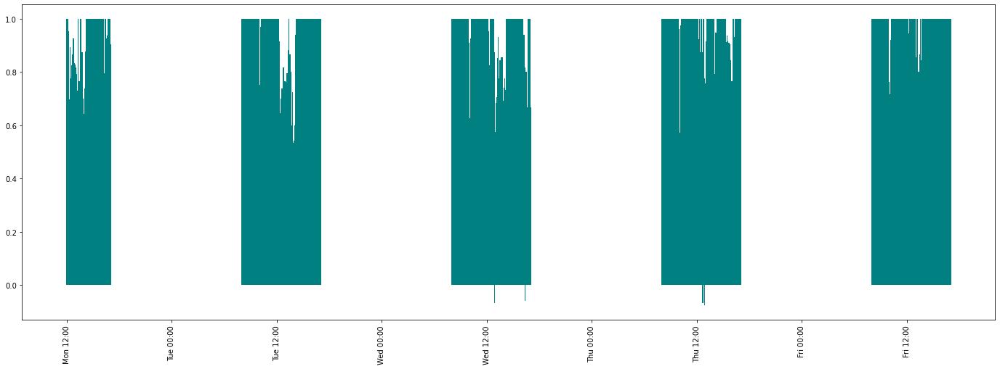

In [10]:
difference = {} #key is timestamp, value is inside % - outside %

for timestamp in total_class_interactions.keys():
    difference[timestamp] = inside_percentages[timestamp] - outside_percentages[timestamp]

figure, axes = plt.subplots(figsize=(24,8)) # set the size that you'd like (width, height)
axes.xaxis.set_major_formatter(mdates.DateFormatter('%a %H:%M'))
plt.xticks(rotation=90)
plt.bar(list(difference.keys()), list(difference.values()), width=0.005, color="teal")

<BarContainer object of 7375 artists>

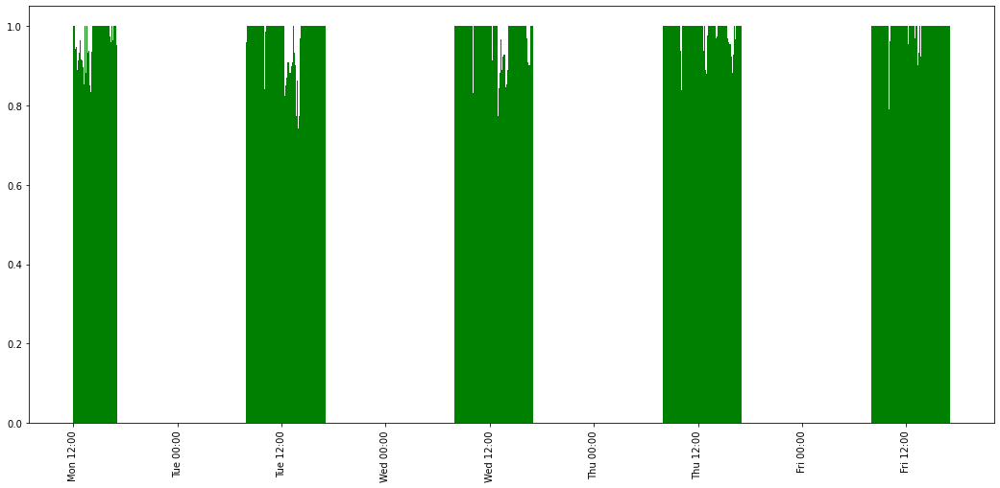

In [7]:
figure, axes = plt.subplots(figsize=(18,8)) # set the size that you'd like (width, height)
axes.xaxis.set_major_formatter(mdates.DateFormatter('%a %H:%M'))
plt.xticks(rotation=90)
plt.bar(list(inside_percentages.keys()), list(inside_percentages.values()), width=0.005, color="green")

If the value of the bar is equal to 100% can I get it to be a different color?

<BarContainer object of 7375 artists>

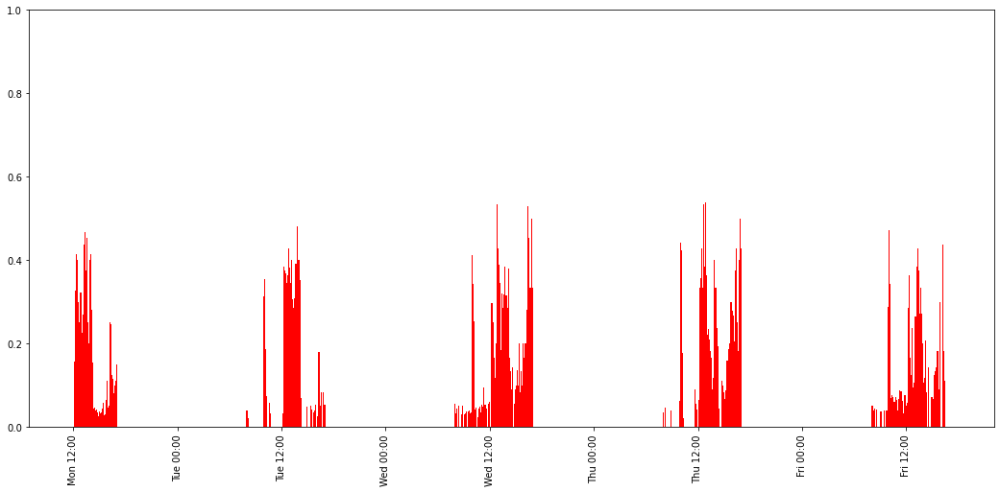

In [8]:
figure, axes = plt.subplots(figsize=(18,8)) # set the size that you'd like (width, height)
axes.xaxis.set_major_formatter(mdates.DateFormatter('%a %H:%M'))
plt.xticks(rotation=90)
plt.ylim(0, 1)
plt.bar(list(outside_percentages.keys()), list(outside_percentages.values()), width=0.005, color="red")

^^ Notice how before noon, there are very few interactions happening outside class, aside from "morning break"

<BarContainer object of 50 artists>

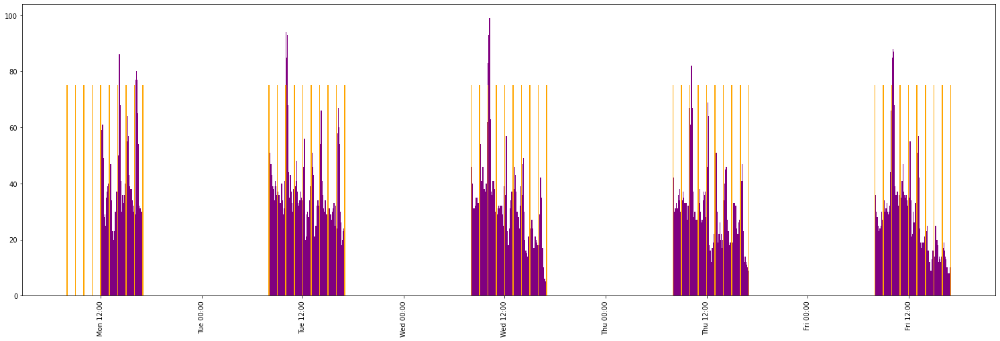

In [14]:
figure, axes = plt.subplots(figsize=(26,8)) # set the size that you'd like (width, height)
axes.xaxis.set_major_formatter(mdates.DateFormatter('%a %H:%M'))
plt.xticks(rotation=90)
plt.bar(list(total_class_interactions.keys()), list(total_class_interactions.values()), width=0.005, color="purple")
plt.bar(xb, yb, width=0.005, color="orange")


^^ Notice how the total amount of interactions goes down through out the day

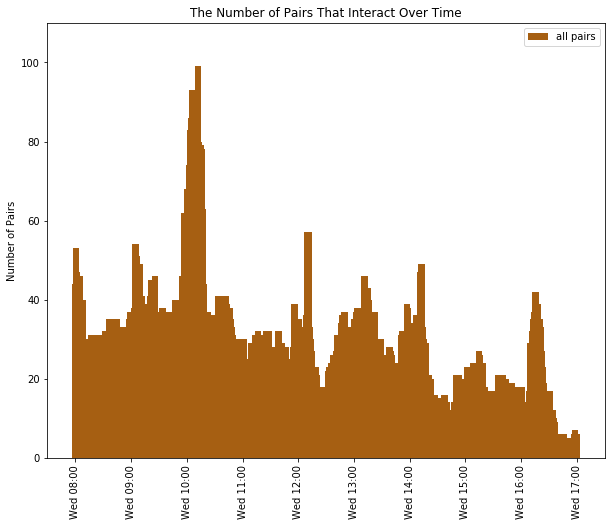

In [8]:
wed_interactions = {}
wed = datetime.datetime(2013, 12, 4).date()
for dat in total_class_interactions:
    if dat.date() == wed:
        wed_interactions[dat] = total_class_interactions[dat]

figure, axes = plt.subplots(figsize=(10,8)) # set the size that you'd like (width, height)
axes.set_ylim(top=110)
axes.set_ylabel("Number of Pairs")
axes.xaxis.set_major_formatter(mdates.DateFormatter('%a %H:%M'))
plt.xticks(rotation=90)
the_graph = plt.bar(list(wed_interactions.keys()),list(wed_interactions.values()), width=0.005, color=(float(166/255), float(95/255), float(18/255)), label="all pairs")

plt.title('The Number of Pairs That Interact Over Time')
plt.legend(handles=[the_graph])
plt.savefig("total_interactions.png")